# Introduction to Flow Matching

In this notebook, we will implement a Flow Matching algorithm for image synthesis. This algorithm is closely linked to the more commonly known Diffusion Models algorithm, with the implementation of both being almost identical. In this lab work, we prefer to use Flow Matching, because the implementation is more straightforward.

**Goals:**


1.   Apply Flow Matching for generation of 2D data, in the case of Moons and Gaussian data
2.   Apply Flow Matching for generation of image data, in the case of mnist images

In [1]:
import argparse, os, random, math
import numpy as np
from pathlib import Path
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import Tensor
from torch.utils.data import DataLoader
from torchvision import transforms,datasets
from torchvision import utils as vutils
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons

In [2]:
print(torch.cuda.is_available())
device = "cuda" if torch.cuda.is_available() else "cpu"

True


## Part 1: Flow Matching for 2D data

In this part, we will implement a small MLP for carrying out Flow Matching.

First, we set up the model. This will have the following architecture:


- fully-connected, $d+1$ input neurons, $n_{hidden}$ output neurons, followed by ReLU
- fully-connected, $n_{hidden}$ input neurons, $n_{hidden}$ output neurons, followed by ReLU
- fully-connected, $n_{hidden}$ input neurons, $n_{hidden}$ output neurons, followed by ReLU
- fully-connected, $n_{hidden}$ input neurons, $d$ output neurons, followed by ReLU


The time step $t$ should be concatenated as an extra dimension to the data (making the input dimension of the data to be 3). We will set $n_{hidden}=64$.

In [3]:
class MLP_FM(nn.Module):

	def __init__(self, dim=1, n_hidden=64):
		super().__init__()
		d0 = dim + 1  # +1 for time map

		self.net = nn.Sequential(
				 nn.Linear(d0, n_hidden),
					nn.ReLU(),
					nn.Linear(n_hidden, n_hidden),
					nn.ReLU(),
					nn.Linear(n_hidden, n_hidden),
					nn.ReLU(),
					nn.Linear(n_hidden, dim)
		) #FILL IN STUDENT

	def forward(self, x_t, t):
		B = x_t.shape[0]
		t = t.view(B, 1)
		x_in = torch.cat([x_t, t], dim=1)
		return self.net(x_in) #FILL IN STUDENT

Now, we set up the necessary functions for Flow Matching. You will have to modify the following functions:
- ```coeffs_and_derivs```
- ```fm_training_step```

The first contains the coefficients $\alpha_t, \beta_t$ and derivatives $\dot{\alpha}_t,\dot{\beta}_t$ which correspond to the schedule of the interpolation (see lesson). Fill in these functions now.

In [4]:
def sample_prior_like(x):
	return torch.randn_like(x) #FILL IN STUDENT

def get_velocity(model, x_t, t):
	v_t = model(x_t, t)
	return v_t, x_t

# ---- schedules ----
def coeffs_and_derivs(t: torch.Tensor, schedule: str):
	if schedule == "linear":
		alpha_t = 1 - t #FILL IN STUDENT
		beta_t = t #FILL IN STUDENT
		alpha_t_dot = - torch.ones_like(t) #FILL IN STUDENT
		beta_t_dot = torch.ones_like(t) #FILL IN STUDENT
		return alpha_t, beta_t, alpha_t_dot, beta_t_dot
	elif schedule == "cosine":
		half_pi_t = 0.5*math.pi*t #FILL IN STUDENT
		alpha_t = torch.cos(half_pi_t) #FILL IN STUDENT
		beta_t = torch.sin(half_pi_t) #FILL IN STUDENT
		alpha_t_dot = -0.5 * math.pi * torch.sin(half_pi_t) #FILL IN STUDENT
		beta_t_dot = 0.5 * math.pi * torch.cos(half_pi_t) #FILL IN STUDENT
		return alpha_t, beta_t, alpha_t_dot, beta_t_dot
	else:
		raise ValueError(f"Unknown schedule: {schedule}")

def fm_training_step(model, x_0, x_1, device, schedule="linear"):
    B = x_1.size(0)

    x_0 = x_0.to(device)
    x_1 = x_1.to(device)

    t = torch.rand(B, device=device)

    alpha_t, beta_t, alpha_t_dot, beta_t_dot = coeffs_and_derivs(t, schedule)

    # Important: reshape from [B] to [B, 1]
    alpha_t = alpha_t.view(B, 1)
    beta_t = beta_t.view(B, 1)
    alpha_t_dot = alpha_t_dot.view(B, 1)
    beta_t_dot = beta_t_dot.view(B, 1)

    x_t = alpha_t * x_0 + beta_t * x_1

    v_t, _ = get_velocity(model, x_t, t)

    target = alpha_t_dot * x_0 + beta_t_dot * x_1

    loss = F.mse_loss(v_t, target)

    return loss

def sample_euler_trajectory(model, shape, steps=50, device="cuda"):
	model.eval()
	h = 1.0 / steps
	torch.manual_seed(123)
	x_t = torch.randn(shape,device=device)
	frames = []
	for k in range(steps):
		t = torch.full((shape[0],), (k + 0.5) / steps, device=device)
		v_t, _ = get_velocity(model, x_t, t) #FILL IN STUDENT
		x_t = x_t + h*v_t #FILL IN STUDENT
		frames.append(x_t)
	traj = torch.stack(frames, dim=0)
	traj = torch.permute(traj,(1,0,2)) # -> [B,n_steps, 2]
	return traj

@torch.no_grad()
def show_trajectory_2d(traj):
	B,n_steps,_ = traj.shape
	fig, axes = plt.subplots(1, n_steps + 1, figsize=(30, 3), sharex=True, sharey=True)
	print(traj.shape)
	axes[0].scatter( (traj.detach().cpu())[:,0, 0], (traj.detach().cpu())[:,0, 1], s=10)
	for i in range(0,n_steps):
		axes[i+1].scatter( (traj.detach().cpu())[:,i, 0], (traj.detach().cpu())[:,i, 1], s=10)
		axes[i+1].set_xlim(-4.0, 4.0)
		axes[i+1].set_ylim(-4.0, 4.0)
	plt.tight_layout()
	plt.show()

Now, we carry out the training itself. Fill in where necessary.

torch.Size([100, 10, 2])


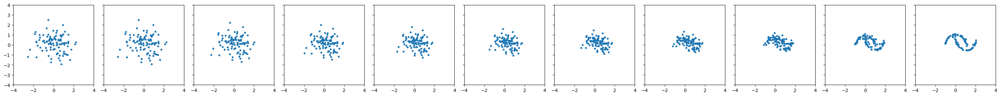

In [5]:
####################################
#######    HYPERPARAMETERS   #######
####################################

learning_rate = 1e-2
schedule = "linear"
n_hidden = 64
sample_every = 5000
batch_size = 256
steps_sampler = 10
n_samples = 100
n_iters = 5000

####################################
#########    ARCHITECTURE   ########
####################################

in_dim = 2
model = MLP_FM(dim=in_dim, n_hidden=n_hidden).to(device)

####################################
#########   TRAINING   ########
####################################

# optimiser
opt = torch.optim.Adam(model.parameters(), lr=learning_rate)

#training
for iteration in range(1, n_iters + 1):
  model.train()
  running = 0.0

  # data
  x_1 = x_1_np, _ = make_moons(n_samples=batch_size, noise=0.05)
  x_1 = torch.tensor(x_1_np, dtype=torch.float32, device=device) #FILL IN STUDENT

  x_0 = sample_prior_like(x_1)

  opt.zero_grad()
  loss = fm_training_step(model,x_0=x_0,x_1=x_1,device=device,schedule=schedule)
  loss.backward()
  opt.step()

  if iteration % sample_every == 0:
    # traj : [B, n_steps, dim]
    traj = sample_euler_trajectory(
      model,
      shape=(n_samples,2),
      steps=steps_sampler,
      device=device
    )
    show_trajectory_2d( traj)

## 1.2 Schedule comparison

In Flow Matching, the "schedule", ie the functions $\alpha_t$ and $\beta_t$ can affect the results. In this part, we will compare the "linear" schedule with the "cosine" schedule:
- Linear: $\alpha_t = 1-t$, $\beta_t = t$
- Cosine: ?

 First, we define a function to visualise the flow path.

In [6]:
def display_flow_path(traj):
	# traj : [B,n_steps,dim]
  B,n_steps,_ = traj.shape
  traj_np = traj.detach().cpu().numpy()
	# Plot the flow paths
  plt.figure(figsize=(8, 6))

  for i in range(0,B):
    plt.plot(traj_np[i,:,0], traj_np[i,:,1], marker="o", markersize=2, alpha=0.7)
    # special cases to show beginning and end
    plt.scatter(traj_np[i,0,0], traj_np[i,0,1], marker="*", alpha=0.7)
    plt.scatter(traj_np[i,-1,0], traj_np[i,-1,1], marker="^", alpha=0.7)


  plt.xlabel("X-axis")
  plt.ylabel("Y-axis")
  plt.title("Flow path")
	# xmin = -1.5
	# xmax = 1.5
	# ymin = -1.5
	# ymax = 1.5
	# plt.xlim(xmin, xmax)
	# plt.ylim(ymin, ymax)
  plt.axis('equal')
  plt.tight_layout()
  plt.show()

Now, train the model with the linear schedule and the cosine schedule, between two 2D Gaussian distributions, shifted by $(1,1)$, and compare. What do you observe?

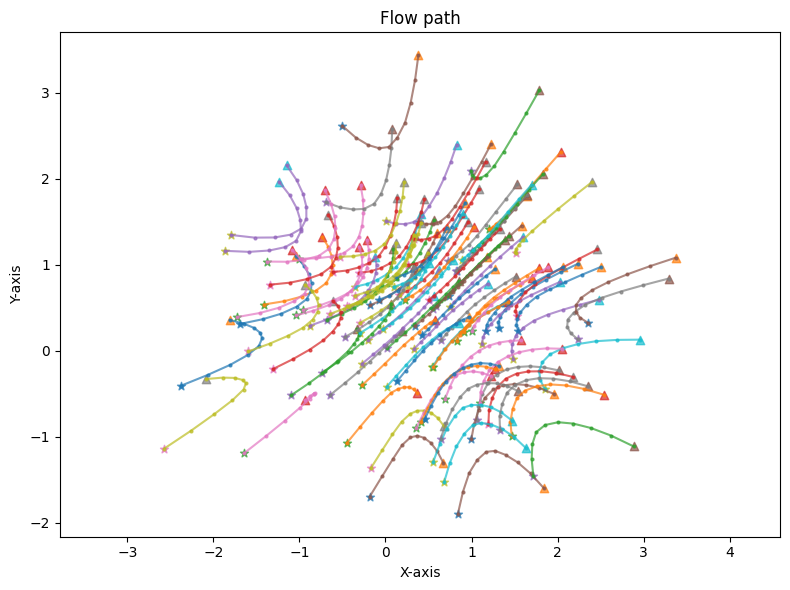

In [8]:
####################################
#######    HYPERPARAMETERS   #######
####################################

learning_rate = 1e-2
schedule = "linear"  # Change to "cosine" for the second experiment
n_hidden = 64
sample_every = 5000
batch_size = 256
steps_sampler = 10
n_samples = 100
n_iters = 5000

####################################
#########    ARCHITECTURE   ########
####################################

in_dim = 2
model = MLP_FM(dim=in_dim, n_hidden=n_hidden).to(device)

####################################
#########   TRAINING   ########
####################################

# Optimiser
opt = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Training
for iteration in range(1, n_iters + 1):
    model.train()

    # Target data distribution: N((1, 1), I)
    x_1 = torch.randn(batch_size, 2, device=device) + torch.tensor(
        [1.0, 1.0],
        device=device
    )

    # Source distribution: N((0, 0), I)
    x_0 = sample_prior_like(x_1)

    opt.zero_grad()

    loss = fm_training_step(
        model,
        x_0=x_0,
        x_1=x_1,
        device=device,
        schedule=schedule
    )

    loss.backward()
    opt.step()

    if iteration % sample_every == 0:
        # traj shape: [n_samples, steps_sampler, 2]
        traj = sample_euler_trajectory(
            model,
            shape=(n_samples, 2),
            steps=steps_sampler,
            device=device
        )

        display_flow_path(traj)

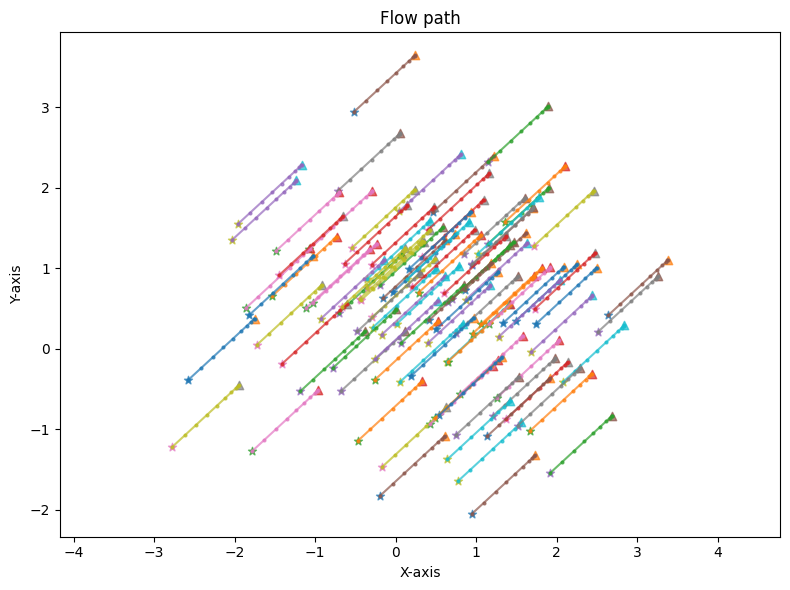

In [9]:
# WITH COSINE SCHEDULE
####################################
#######    HYPERPARAMETERS   #######
####################################

learning_rate = 1e-2
schedule = "cosine"
n_hidden = 64
sample_every = 5000
batch_size = 256
steps_sampler = 10
n_samples = 100
n_iters = 5000

####################################
#########    ARCHITECTURE   ########
####################################

in_dim = 2
model = MLP_FM(dim=in_dim, n_hidden=n_hidden).to(device)

####################################
#########   TRAINING   ########
####################################

# Optimiser
opt = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Training
for iteration in range(1, n_iters + 1):
    model.train()

    # Target data distribution: N((1, 1), I)
    x_1 = torch.randn(batch_size, 2, device=device) + torch.tensor(
        [1.0, 1.0],
        device=device
    )

    # Source distribution: N((0, 0), I)
    x_0 = sample_prior_like(x_1)

    opt.zero_grad()

    loss = fm_training_step(
        model,
        x_0=x_0,
        x_1=x_1,
        device=device,
        schedule=schedule
    )

    loss.backward()
    opt.step()

    if iteration % sample_every == 0:
        # traj shape: [n_samples, steps_sampler, 2]
        traj = sample_euler_trajectory(
            model,
            shape=(n_samples, 2),
            steps=steps_sampler,
            device=device
        )

        display_flow_path(traj)

## Part 2.1: images (mnist)

In this part, we will implement a U-Net for the case of mnist images.

The U-Net will have the following architecture:

## Input
- Input image  
  $x_t \in \mathbb{R}^{B \times 1 \times 28 \times 28}$
- Scalar time  
  $t \in \mathbb{R}^{B}$, expanded to a time map and concatenated:
  
  $$
  x_{\text{in}} = \mathrm{concat}(x_t,\; t\text{-map})
  \in \mathbb{R}^{B \times (2) \times 28 \times 28}
  $$

## Encoder
- **DoubleConv** $2 \rightarrow 32$ &nbsp; (28 × 28)
- **MaxPool** $2 \times 2$ &nbsp; (14 × 14)
- **DoubleConv** $32 \rightarrow 64$ &nbsp; (14 × 14)
- **MaxPool** $2 \times 2$ &nbsp; (7 × 7)

## Middle layer (Bottleneck)
- **DoubleConv** $64 \rightarrow 64$ &nbsp; (7 × 7)

## Decoder
- **TransposedConv** $64 \rightarrow 64$, kernel $2 \times 2$, stride 2 &nbsp; (14 × 14)
- Add skip connection from encoder feature map ($e_2$)
- **DoubleConv** $64 \rightarrow 32$ &nbsp; (14 × 14)
- **TransposedConv** $32 \rightarrow 32$, kernel $2 \times 2$, stride 2 &nbsp; (28 × 28)
- Add skip connection from encoder feature map ($e_1$)
- **DoubleConv** $32 \rightarrow 32$ &nbsp; (28 × 28)

## Output
- $1 \times 1$ convolution $c_1 \rightarrow C_{\text{out}}$
- Output tensor  
  $\in \mathbb{R}^{B \times C_{\text{out}} \times 28 \times 28}$

Again, the time step $t$ should be concatenated as an extra channel to the data, making the input number of channels to be 2). The ```DoubleConv'' layer is already implemented.

Implement this architecture now.

In [10]:
# ----------------------------
# Model
# ----------------------------

class DoubleConv(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(c_in, c_out, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(c_out, c_out, 3, padding=1),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)


class UNetModel(nn.Module):

    def __init__(self, in_channels=1, n_hidden=32, out_channels=1):
        super().__init__()

        c0 = in_channels + 1  # image channel + time-map channel
        c1, c2 = n_hidden, n_hidden * 2

        # Encoder
        self.enc1 = DoubleConv(c0, c1)             # 28x28
        self.down1 = nn.MaxPool2d(kernel_size=2)   # 28 -> 14

        self.enc2 = DoubleConv(c1, c2)             # 14x14
        self.down2 = nn.MaxPool2d(kernel_size=2)   # 14 -> 7

        # Bottleneck
        self.bott = DoubleConv(c2, c2)             # 7x7

        # Decoder
        self.up2 = nn.ConvTranspose2d(
            c2,
            c2,
            kernel_size=2,
            stride=2
        )                                           # 7 -> 14

        self.dec2 = DoubleConv(c2, c1)              # 14x14, c2 -> c1

        self.up1 = nn.ConvTranspose2d(
            c1,
            c1,
            kernel_size=2,
            stride=2
        )                                           # 14 -> 28

        self.dec1 = DoubleConv(c1, c1)              # 28x28

        self.out = nn.Conv2d(
            c1,
            out_channels,
            kernel_size=1
        )

    def forward(self, x_t, t):
        b, _, h, w = x_t.shape

        # Convert scalar time into an image-sized channel
        t = t.view(b, 1, 1, 1)
        tmap = t.expand(b, 1, h, w)

        # Concatenate noisy/interpolated image and time channel
        x_in = torch.cat([x_t, tmap], dim=1)

        # Encoder
        e1 = self.enc1(x_in)      # (B, c1, 28, 28)
        p1 = self.down1(e1)       # (B, c1, 14, 14)

        e2 = self.enc2(p1)        # (B, c2, 14, 14)
        p2 = self.down2(e2)       # (B, c2, 7, 7)

        # Bottleneck
        btt = self.bott(p2)       # (B, c2, 7, 7)

        # Decoder with additive skip connections
        u2 = self.up2(btt)        # (B, c2, 14, 14)
        s2 = u2 + e2              # add encoder skip
        d2 = self.dec2(s2)        # (B, c1, 14, 14)

        u1 = self.up1(d2)         # (B, c1, 28, 28)
        s1 = u1 + e1              # add encoder skip
        d1 = self.dec1(s1)        # (B, c1, 28, 28)

        return self.out(d1)       # (B, out_channels, 28, 28)

We define some new tools for visualisation (code given):

In [11]:
# ----------------------------
# Trajectory sampling tools
# ----------------------------

@torch.no_grad()
def save_trajectory_grid(traj):
	B,steps, C, H, W = traj.shape
	imgs = traj.reshape(B * steps, C, H, W)
	grid = vutils.make_grid(normalize_to_0_1(imgs), nrow=steps) #.clamp(0, 1)

	# Convert from (C, H, W) → (H, W, C)
	grid = grid.permute(1, 2, 0).cpu().numpy()

	plt.figure(figsize=(steps, B))
	plt.imshow(grid)
	plt.axis("off")
	plt.show()
	#vutils.save_image(grid, path)

def normalize_to_0_1(imgs: torch.Tensor) -> torch.Tensor:
	"""
	Normalize a batch of images to [0,1] range per image.
	imgs: (B, C, H, W)
	"""
	min_val = imgs.amin(dim=(1,2,3), keepdim=True)
	max_val = imgs.amax(dim=(1,2,3), keepdim=True)
	return (imgs - min_val) / (max_val - min_val + 1e-8)

Next, the data loader for mnist (code given). We have allowed to clip the size of the dataset for faster execution. Code given.

In [12]:
def mnist_data_loader(data_root, image_size=28,batch_size=64,max_dataset_size=-1,shuffle=True):
	tfm = transforms.Compose([
		transforms.Resize(image_size),
		transforms.ToTensor(),
		transforms.Lambda(lambda x: x * 2.0 - 1.0) # normalise to (-1,1)
	])
	ds = datasets.MNIST(data_root, train=True, download=True, transform=tfm)
	if(max_dataset_size>0):
		ds = torch.utils.data.random_split(ds, [max_dataset_size, len(ds)-max_dataset_size])[0]
	dl = DataLoader(ds, batch_size=batch_size, shuffle=shuffle, num_workers=4, pin_memory=True)
	return dl

Now, we re-define the functions used for the Flow Matching. You will have to modify the following one:
- fm_training_step

The others stay the same or are given.


In [13]:
def get_velocity(model, x_t, t):
    v_t = model(x_t, t)
    return v_t, x_t


def fm_training_step(model, x_0, x_1, device, schedule="linear"):
    B = x_1.size(0)

    x_0 = x_0.to(device)
    x_1 = x_1.to(device)

    # One random time for each image in the batch
    t = torch.rand(B, device=device)

    # Interpolation coefficients and their derivatives
    a0, a1, a0_dot, a1_dot = coeffs_and_derivs(t, schedule)

    # Reshape coefficients so they broadcast over C, H, W
    a0 = a0.view(B, 1, 1, 1)
    a1 = a1.view(B, 1, 1, 1)
    a0_dot = a0_dot.view(B, 1, 1, 1)
    a1_dot = a1_dot.view(B, 1, 1, 1)

    # Intermediate image along the chosen interpolation
    x_t = a0 * x_0 + a1 * x_1

    # Predicted velocity field
    v_t, _ = get_velocity(model, x_t, t)

    # Exact velocity of the interpolation path
    target = a0_dot * x_0 + a1_dot * x_1

    loss = F.mse_loss(v_t, target)
    return loss


@torch.no_grad()
def sample_euler_trajectory(model, shape, steps=50, device="cuda"):
    model.eval()

    h = 1.0 / steps

    # Fixed seed makes the generated examples reproducible
    torch.manual_seed(123)

    # Initial Gaussian-noise images
    x_t = torch.randn(shape, device=device)

    frames = []

    for k in range(steps):
        # Midpoint time of the current Euler interval
        t = torch.full(
            (shape[0],),
            (k + 0.5) / steps,
            device=device
        )

        # Velocity predicted at the current images and time
        v_t, _ = get_velocity(model, x_t, t)

        # Euler approximation of dx/dt = v_theta(x, t)
        x_t = x_t + h * v_t

        frames.append(x_t.clone())

    # [steps, B, C, H, W]
    traj = torch.stack(frames, dim=0)

    # [B, steps, C, H, W]
    traj = torch.permute(traj, (1, 0, 2, 3, 4))

    return traj

Finally, train and look at the results ! You should start to see reasonable (but not great) results around 50 epochs.

100%|██████████| 9.91M/9.91M [00:00<00:00, 19.9MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 482kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.43MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 9.61MB/s]
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker crea

[Epoch 001] loss=1.312069
[Epoch 002] loss=0.549406
[Epoch 003] loss=0.431256
[Epoch 004] loss=0.379434
[Epoch 005] loss=0.349498
[Epoch 006] loss=0.329948
[Epoch 007] loss=0.314069
[Epoch 008] loss=0.302864
[Epoch 009] loss=0.291033
[Epoch 010] loss=0.285207


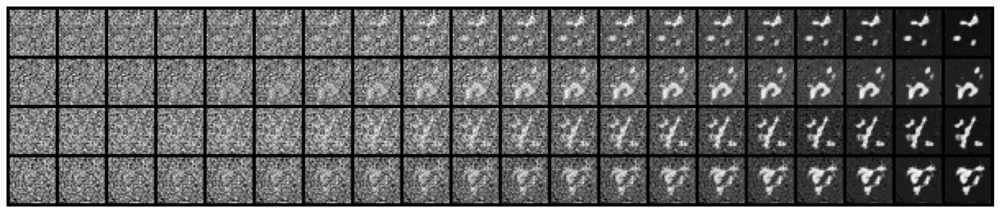

[Epoch 011] loss=0.280623
[Epoch 012] loss=0.278393
[Epoch 013] loss=0.268076
[Epoch 014] loss=0.266441
[Epoch 015] loss=0.263530
[Epoch 016] loss=0.261825
[Epoch 017] loss=0.259065
[Epoch 018] loss=0.257429
[Epoch 019] loss=0.252441
[Epoch 020] loss=0.251063


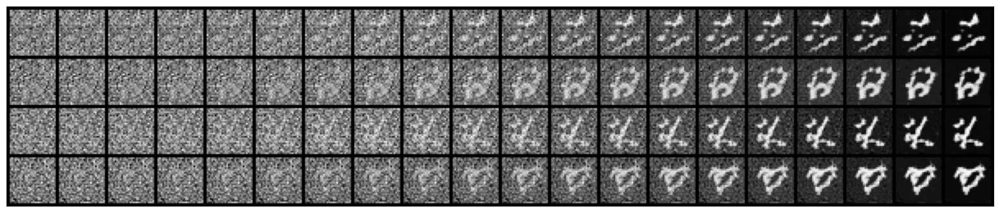

[Epoch 021] loss=0.249621
[Epoch 022] loss=0.252677
[Epoch 023] loss=0.244871
[Epoch 024] loss=0.243677
[Epoch 025] loss=0.242857
[Epoch 026] loss=0.243110
[Epoch 027] loss=0.243040
[Epoch 028] loss=0.243191
[Epoch 029] loss=0.236585
[Epoch 030] loss=0.235883


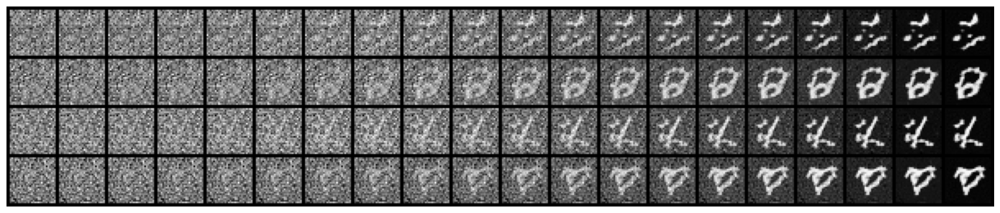

[Epoch 031] loss=0.235728
[Epoch 032] loss=0.238978
[Epoch 033] loss=0.232824
[Epoch 034] loss=0.231448
[Epoch 035] loss=0.233697
[Epoch 036] loss=0.232769
[Epoch 037] loss=0.231867
[Epoch 038] loss=0.231348
[Epoch 039] loss=0.226840
[Epoch 040] loss=0.227823


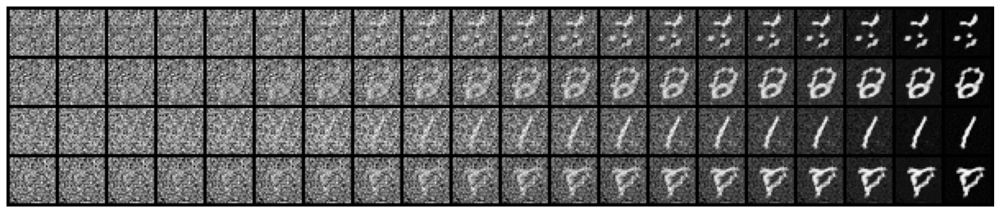

[Epoch 041] loss=0.227915
[Epoch 042] loss=0.229665
[Epoch 043] loss=0.224769
[Epoch 044] loss=0.225016
[Epoch 045] loss=0.225240
[Epoch 046] loss=0.224100
[Epoch 047] loss=0.224123
[Epoch 048] loss=0.224443
[Epoch 049] loss=0.220545
[Epoch 050] loss=0.221154


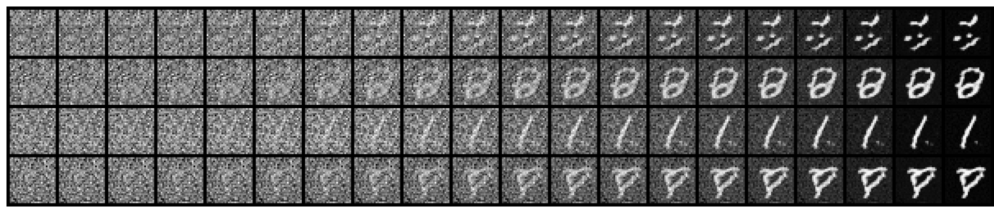

In [14]:
####################################
#######    HYPERPARAMETERS   #######
####################################

learning_rate = 3e-4
schedule = "linear"
sample_every = 10
batch_size = 64
n_hidden = 32
steps_sampler = 20
n_samples = 4
n_epochs = 50
max_mnist_size = 7000

####################################
#########    DATASET SETUP   #######
####################################

data_root = "./data"
train_loader = mnist_data_loader(data_root, image_size=28,batch_size=64,max_dataset_size=max_mnist_size,shuffle=True)

####################################
#########    ARCHITECTURE   ########
####################################

in_channels = 1
out_channels = 1
model = UNetModel(in_channels=in_channels, n_hidden=n_hidden, out_channels=out_channels).to(device)

####################################
#########   TRAINING   ########
####################################

# optimiser
opt = torch.optim.AdamW(model.parameters(), lr=learning_rate)

#training
for epoch in range(1, n_epochs + 1):
  model.train()
  running = 0.0
  for x_1,_ in train_loader:
    x_0 = sample_prior_like(x_1)

    opt.zero_grad(set_to_none=True)
    loss = fm_training_step(model,x_0=x_0,x_1=x_1,device=device,schedule=schedule)
    loss.backward()
    opt.step()
    running += loss.item()
  print(f"[Epoch {epoch:03d}] loss={running/len(train_loader):.6f}")

  if epoch % sample_every == 0:
    traj = sample_euler_trajectory(
      model,
      shape=(n_samples,x_0.shape[1],x_0.shape[2],x_0.shape[3]),
      steps=steps_sampler,
      device=device
    )
    save_trajectory_grid(traj)

## Part 2.2 Image-to-image translation

In this part, we will convert images between the two following domains:
- Fashion mnist (grey-scale images of clothes)
- mnist

First, we provide the Fashion mnist data loader:

In [15]:
def fashion_mnist_data_loader(data_root, image_size=28,batch_size=64,max_dataset_size=-1,shuffle=True):
	tfm = transforms.Compose([
		transforms.Resize(image_size),
		transforms.ToTensor(),
		transforms.Lambda(lambda x: x * 2.0 - 1.0) # normalise to (-1,1)
	])
	ds = datasets.FashionMNIST(data_root, train=True, download=True, transform=tfm)
	if(max_dataset_size>0):
		ds = torch.utils.data.random_split(ds, [max_dataset_size, len(ds)-max_dataset_size])[0]
	dl = DataLoader(ds, batch_size=batch_size, shuffle=shuffle, num_workers=4, pin_memory=True)
	return dl

Now, create a new trajectory sampling function to sample from the source distribution

In [16]:
def sample_euler_trajectory_image_to_image(model, train_loader_source, n_samples=4, steps=50, device="cuda"):
    model.eval()
    h = 1.0 / steps
    torch.manual_seed(123)

    x_t, _ = next(iter(train_loader_source))
    x_t = x_t.to(device)[:n_samples, :]

    frames = []
    for k in range(steps):
        t = torch.full((x_t.shape[0],), (k + 0.5) / steps, device=device)
        v_t, _ = get_velocity(model, x_t, t)   # FILL IN STUDENT
        x_t = x_t + h * v_t                    # FILL IN STUDENT
        frames.append(x_t)

    traj = torch.stack(frames, dim=0)
    traj = torch.permute(traj, (1, 0, 2, 3, 4))  # -> [B, n_steps, C, H, W]
    return traj

Finally, keeping the same hyper-parameters, modify the training code to carry out image-to-image translation.

[Epoch 001] loss=0.488010
[Epoch 002] loss=0.287492
[Epoch 003] loss=0.233033
[Epoch 004] loss=0.204648
[Epoch 005] loss=0.183639
[Epoch 006] loss=0.167666
[Epoch 007] loss=0.158339
[Epoch 008] loss=0.150982
[Epoch 009] loss=0.143948
[Epoch 010] loss=0.137058


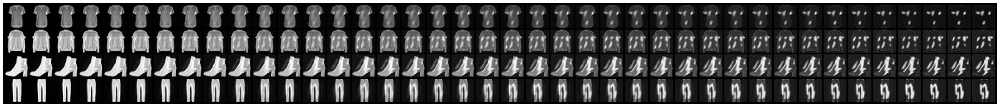

[Epoch 011] loss=0.132011
[Epoch 012] loss=0.128679
[Epoch 013] loss=0.120097
[Epoch 014] loss=0.122038
[Epoch 015] loss=0.116333
[Epoch 016] loss=0.112826
[Epoch 017] loss=0.110742
[Epoch 018] loss=0.107188
[Epoch 019] loss=0.104667
[Epoch 020] loss=0.102697


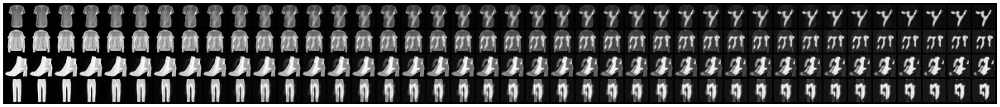

[Epoch 021] loss=0.103968
[Epoch 022] loss=0.099567
[Epoch 023] loss=0.096289
[Epoch 024] loss=0.098546
[Epoch 025] loss=0.093986
[Epoch 026] loss=0.091270
[Epoch 027] loss=0.089817
[Epoch 028] loss=0.089964
[Epoch 029] loss=0.087848
[Epoch 030] loss=0.086418


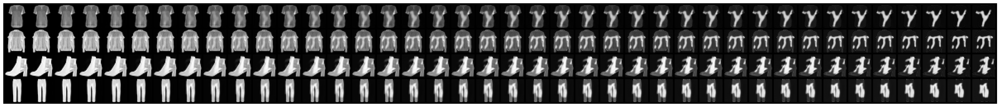

[Epoch 031] loss=0.088229
[Epoch 032] loss=0.086234
[Epoch 033] loss=0.083842
[Epoch 034] loss=0.084399
[Epoch 035] loss=0.080736
[Epoch 036] loss=0.079702
[Epoch 037] loss=0.078342
[Epoch 038] loss=0.079335
[Epoch 039] loss=0.078462
[Epoch 040] loss=0.075869


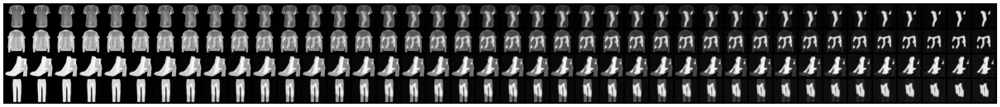

[Epoch 041] loss=0.078433
[Epoch 042] loss=0.077513
[Epoch 043] loss=0.075373
[Epoch 044] loss=0.075537
[Epoch 045] loss=0.071838
[Epoch 046] loss=0.071874
[Epoch 047] loss=0.071433
[Epoch 048] loss=0.072351
[Epoch 049] loss=0.071142
[Epoch 050] loss=0.068564


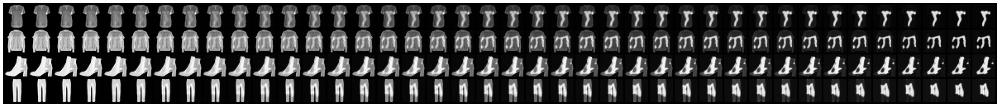

[Epoch 051] loss=0.071335
[Epoch 052] loss=0.070918
[Epoch 053] loss=0.068170
[Epoch 054] loss=0.068880
[Epoch 055] loss=0.066476
[Epoch 056] loss=0.066110
[Epoch 057] loss=0.065599
[Epoch 058] loss=0.067393
[Epoch 059] loss=0.065562
[Epoch 060] loss=0.063091


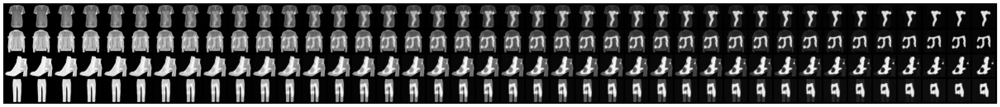

[Epoch 061] loss=0.066438
[Epoch 062] loss=0.066135
[Epoch 063] loss=0.063576
[Epoch 064] loss=0.064068
[Epoch 065] loss=0.062346
[Epoch 066] loss=0.061743
[Epoch 067] loss=0.061226
[Epoch 068] loss=0.062645
[Epoch 069] loss=0.061003
[Epoch 070] loss=0.059229


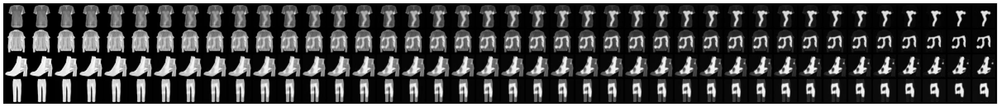

[Epoch 071] loss=0.064004
[Epoch 072] loss=0.062272
[Epoch 073] loss=0.059627
[Epoch 074] loss=0.060287
[Epoch 075] loss=0.058969
[Epoch 076] loss=0.058365
[Epoch 077] loss=0.057897
[Epoch 078] loss=0.062074
[Epoch 079] loss=0.057590
[Epoch 080] loss=0.056095


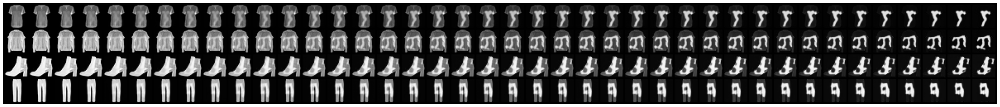

[Epoch 081] loss=0.059698
[Epoch 082] loss=0.058737
[Epoch 083] loss=0.056737
[Epoch 084] loss=0.057041
[Epoch 085] loss=0.055870
[Epoch 086] loss=0.055635
[Epoch 087] loss=0.053974
[Epoch 088] loss=0.056338
[Epoch 089] loss=0.055017
[Epoch 090] loss=0.053497


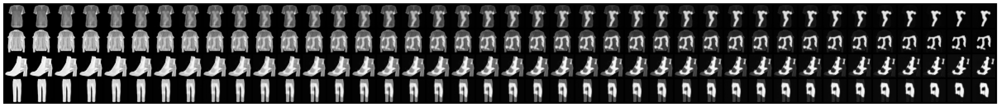

[Epoch 091] loss=0.057072
[Epoch 092] loss=0.056410
[Epoch 093] loss=0.053292
[Epoch 094] loss=0.054492
[Epoch 095] loss=0.053467
[Epoch 096] loss=0.052907
[Epoch 097] loss=0.051282
[Epoch 098] loss=0.055324
[Epoch 099] loss=0.052531
[Epoch 100] loss=0.051323


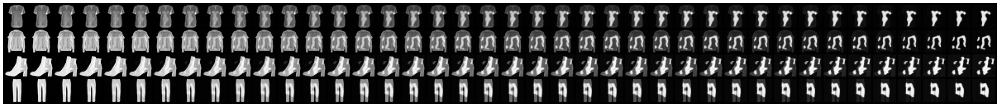

[Epoch 101] loss=0.053814
[Epoch 102] loss=0.053454
[Epoch 103] loss=0.050842
[Epoch 104] loss=0.052183
[Epoch 105] loss=0.050994
[Epoch 106] loss=0.051213
[Epoch 107] loss=0.049671
[Epoch 108] loss=0.051846
[Epoch 109] loss=0.050488
[Epoch 110] loss=0.050353


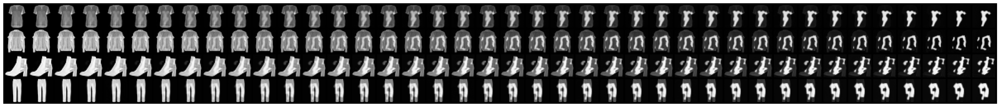

[Epoch 111] loss=0.051496
[Epoch 112] loss=0.051603
[Epoch 113] loss=0.049562
[Epoch 114] loss=0.050201
[Epoch 115] loss=0.048839
[Epoch 116] loss=0.049666
[Epoch 117] loss=0.047851
[Epoch 118] loss=0.050593
[Epoch 119] loss=0.048594
[Epoch 120] loss=0.049242


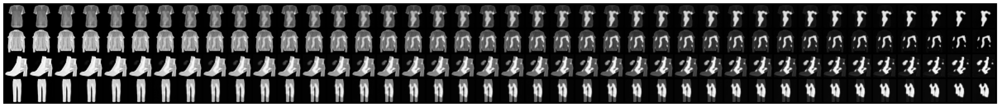

[Epoch 121] loss=0.049814
[Epoch 122] loss=0.050165
[Epoch 123] loss=0.047696
[Epoch 124] loss=0.049799
[Epoch 125] loss=0.046755
[Epoch 126] loss=0.048622
[Epoch 127] loss=0.047955
[Epoch 128] loss=0.048474
[Epoch 129] loss=0.047561
[Epoch 130] loss=0.046491


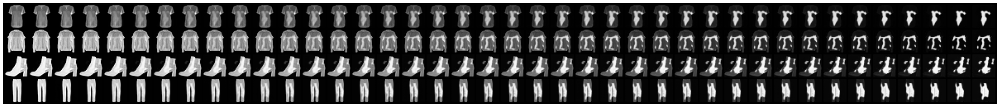

[Epoch 131] loss=0.047694
[Epoch 132] loss=0.047566
[Epoch 133] loss=0.045578
[Epoch 134] loss=0.047961
[Epoch 135] loss=0.045865
[Epoch 136] loss=0.047833
[Epoch 137] loss=0.046778
[Epoch 138] loss=0.047217
[Epoch 139] loss=0.046319
[Epoch 140] loss=0.044397


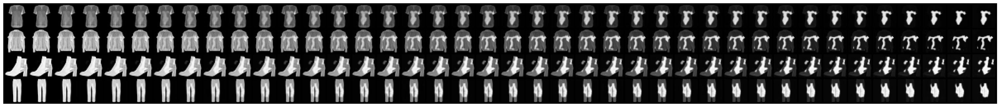

[Epoch 141] loss=0.046573
[Epoch 142] loss=0.047508
[Epoch 143] loss=0.043766
[Epoch 144] loss=0.046835
[Epoch 145] loss=0.044495
[Epoch 146] loss=0.045583
[Epoch 147] loss=0.044407
[Epoch 148] loss=0.045246
[Epoch 149] loss=0.044698
[Epoch 150] loss=0.044201


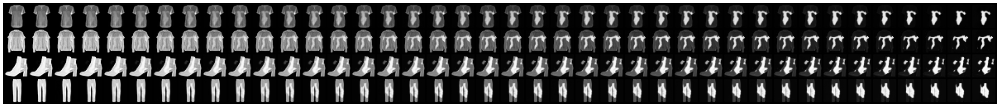

[Epoch 151] loss=0.044643
[Epoch 152] loss=0.044984
[Epoch 153] loss=0.042306
[Epoch 154] loss=0.046144
[Epoch 155] loss=0.043758
[Epoch 156] loss=0.043722
[Epoch 157] loss=0.042651
[Epoch 158] loss=0.044217
[Epoch 159] loss=0.042969
[Epoch 160] loss=0.044709


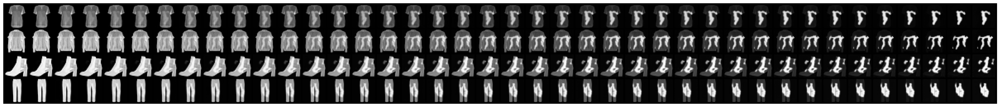

[Epoch 161] loss=0.043197
[Epoch 162] loss=0.044189
[Epoch 163] loss=0.041148
[Epoch 164] loss=0.044079
[Epoch 165] loss=0.042792
[Epoch 166] loss=0.043175
[Epoch 167] loss=0.041571
[Epoch 168] loss=0.043795
[Epoch 169] loss=0.042027
[Epoch 170] loss=0.043270


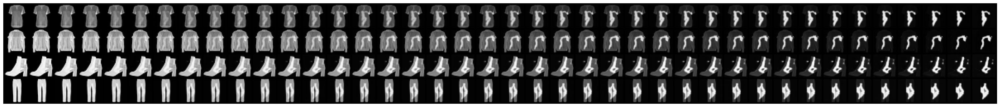

[Epoch 171] loss=0.042408
[Epoch 172] loss=0.043908
[Epoch 173] loss=0.040702
[Epoch 174] loss=0.045028
[Epoch 175] loss=0.040708
[Epoch 176] loss=0.042295
[Epoch 177] loss=0.042000
[Epoch 178] loss=0.042141
[Epoch 179] loss=0.041819
[Epoch 180] loss=0.041437


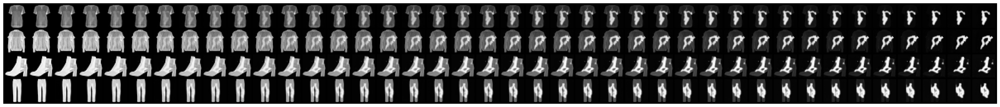

[Epoch 181] loss=0.041672
[Epoch 182] loss=0.043061
[Epoch 183] loss=0.039621
[Epoch 184] loss=0.043731
[Epoch 185] loss=0.039974
[Epoch 186] loss=0.041947
[Epoch 187] loss=0.041817
[Epoch 188] loss=0.042126
[Epoch 189] loss=0.040816
[Epoch 190] loss=0.040456


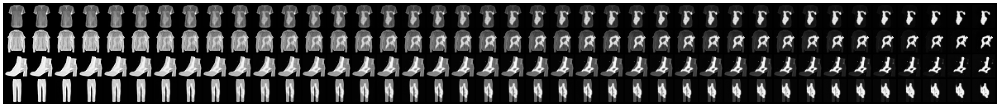

[Epoch 191] loss=0.043981
[Epoch 192] loss=0.042812
[Epoch 193] loss=0.038701
[Epoch 194] loss=0.043987
[Epoch 195] loss=0.039034
[Epoch 196] loss=0.040817
[Epoch 197] loss=0.038976
[Epoch 198] loss=0.040254
[Epoch 199] loss=0.040408
[Epoch 200] loss=0.039824


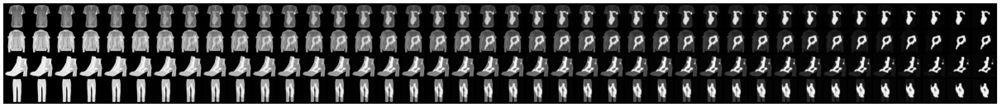

In [18]:
####################################
#######    HYPERPARAMETERS   #######
####################################

learning_rate = 3e-4
schedule = "linear"
sample_every = 10
batch_size = 64
n_hidden = 32
steps_sampler = 40
n_samples = 4
n_epochs = 200
max_mnist_size = 7000

####################################
#########    DATASET SETUP   #######
####################################

data_root = "./data"

train_loader_source = fashion_mnist_data_loader(
    data_root,
    image_size=28,
    batch_size=batch_size,
    max_dataset_size=max_mnist_size,
    shuffle=True
)

train_loader_target = mnist_data_loader(
    data_root,
    image_size=28,
    batch_size=batch_size,
    max_dataset_size=max_mnist_size,
    shuffle=True
)

####################################
#########    ARCHITECTURE   ########
####################################

in_channels = 1
out_channels = 1

model = UNetModel(
    in_channels=in_channels,
    n_hidden=n_hidden,
    out_channels=out_channels
).to(device)

####################################
#########   TRAINING   ########
####################################

opt = torch.optim.AdamW(
    model.parameters(),
    lr=learning_rate
)

for epoch in range(1, n_epochs + 1):
    model.train()
    running = 0.0

    for (x_0, _), (x_1, _) in zip(
        train_loader_source,
        train_loader_target
    ):
        opt.zero_grad(set_to_none=True)

        loss = fm_training_step(
            model,
            x_0=x_0,
            x_1=x_1,
            device=device,
            schedule=schedule
        )

        loss.backward()
        opt.step()

        running += loss.item()

    print(
        f"[Epoch {epoch:03d}] "
        f"loss={running / len(train_loader_source):.6f}"
    )

    if epoch % sample_every == 0:
        traj = sample_euler_trajectory_image_to_image(
            model,
            train_loader_source=train_loader_source,
            n_samples=n_samples,
            steps=steps_sampler,
            device=device
        )

        save_trajectory_grid(traj)